In [ ]:
import tensorflow as tf
from tensorflow.python.framework import test_util
from tensorflow.python.platform import build_info as tf_build_info

physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    # Invalid device or cannot modify virtual devices once initialized.
    print("None")
    pass
    
# TensorFlow version
print("TensorFlow version:", tf.__version__)

# Check if GPU is available
print("Num GPUs Available:", len(tf.config.list_physical_devices('GPU')))

# List all physical devices
print("Physical devices:", tf.config.list_physical_devices())

# GPU device name (if available)
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    print("GPU Name:", tf.config.experimental.get_device_details(gpus[0])['device_name'])
else:
    print("No GPU detected.")

print("Built with CUDA:", tf_build_info.build_info['is_cuda_build'])
print("CUDA version:", tf_build_info.build_info['cuda_version'])
print("cuDNN version:", tf_build_info.build_info['cudnn_version'])
import sys
print(sys.version)

In [ ]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import efficientnet
from tensorflow.keras.layers import TextVectorization


seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)

IMAGE_PATH = r'...\Flickr30k\Images'

# Desired image dimensions
IMAGE_SIZE = (224, 224)

# Vocabulary size
VOCAB_SIZE = 10000

# Fixed length allowed for any sequence
#SEQ_LENGTH: This is the fixed length allowed for any sequence in the input data. It means that the length of each sequence is restricted to 25, 
#and any sequence longer than this length will be truncated, while any sequence shorter than this length will be padded.
SEQ_LENGTH = 25

# Dimension for the image embeddings and token embeddings
#The embedding is a process of representing the input data in a lower-dimensional space, which is easier to process. 
#In this case, both the image and the tokens are represented in a 512-dimensional space.
EMBED_DIM = 512

# Per-layer units in the feed-forward network
#The feed-forward network is a type of neural network in which the data flows in one direction, from input to output, without any loops or feedback.
#The number of units in the feed-forward network affects the model's capacity to learn complex patterns.
FF_DIM = 512

# Other training parameters which we will during the traing 
BATCH_SIZE = 64
EPOCHS = 20
AUTOTUNE = tf.data.AUTOTUNE

def load_captions_data(filename):
    """Loads captions (text) data and maps them to corresponding images."""
    with open(filename, encoding='utf-8') as caption_file:
        caption_data = caption_file.readlines()
        caption_mapping = {}
        text_data = []
        images_to_skip = set()

        for line in caption_data:
            line = line.rstrip("\n")
            
            # Check if line contains at least one comma separating image name and caption
            if len(line.split(",", 1)) < 2:
                continue  # Skip malformed lines

            img_name, caption = line.split(",", 1)
            
            # Remove extra quotes around caption text and split at the first comma in case there are internal commas
            caption = caption.strip().strip('"')
            
            img_name = os.path.join(IMAGE_PATH, img_name.strip())

            tokens = caption.strip().split()

            if len(tokens) < 5 or len(tokens) > SEQ_LENGTH:
                images_to_skip.add(img_name)
                continue

            if img_name.endswith("jpg") and img_name not in images_to_skip:
                caption = "<start> " + caption.strip() + " <end>"
                text_data.append(caption)

                if img_name in caption_mapping:
                    caption_mapping[img_name].append(caption)
                else:
                    caption_mapping[img_name] = [caption]

        # Remove images that were skipped
        for img_name in images_to_skip:
            if img_name in caption_mapping:
                del caption_mapping[img_name]

        return caption_mapping, text_data

# Test the function again
caption_mapping, text_data = load_captions_data(r'...\Flickr30k\captions1.txt')
print(caption_mapping.keys())  # print the first few image names
print(text_data[:5])  # print the first 5 captions
        
caption_mapping, text_data = load_captions_data(r'...\captions1.txt')


In [3]:
def train_val_split(caption_data, train_size=0.9, shuffle=True):
    """Split the captioning dataset into train and validation sets."""
    
    # 1. Get the list of all image names
    all_images = list(caption_data.keys())

    # 2. Shuffle if necessary
    if shuffle:
        np.random.shuffle(all_images)

    # 3. Split into training and validation sets
    train_size = int(len(caption_data) * train_size)

    training_data = {
        img_name: caption_data[img_name] for img_name in all_images[:train_size]
    }
    validation_data = {
        img_name: caption_data[img_name] for img_name in all_images[train_size:]
    }

    # 4. Return the splits
    return training_data, validation_data

# Load the dataset
captions_mapping, text_data = load_captions_data(r'...\Flickr30k\captions1.txt')

# Split the dataset into training and validation sets
train_data, valid_data = train_val_split(captions_mapping)

print("Number of training samples: ", len(train_data))
print("Number of validation samples: ", len(valid_data))


Number of training samples:  24110
Number of validation samples:  2679


In [4]:
def custom_standardization(input_string):
    lowercase = tf.strings.lower(input_string)
    return tf.strings.regex_replace(lowercase, "[%s]" % re.escape(strip_chars), "")

#Remove punchuation
strip_chars = "!\"#$%&'()*+,-./:;<=>?@[\]^_`{|}~"
strip_chars = strip_chars.replace("<", "")
strip_chars = strip_chars.replace(">", "")

vectorization = TextVectorization(
    max_tokens=VOCAB_SIZE,
    output_mode="int",
    output_sequence_length=SEQ_LENGTH,
    standardize=custom_standardization,
)
vectorization.adapt(text_data)

# def load_vocab(filename):
#     with open(filename, encoding='utf-8') as f:
#         return [line.strip() for line in f]
# vocab = load_vocab("my_vocab.txt")
# vectorization = TextVectorization(
#     max_tokens=VOCAB_SIZE,
#     output_mode="int",
#     output_sequence_length=SEQ_LENGTH,
#     standardize=custom_standardization,
# )
# vectorization.set_vocabulary(vocab)


# Data augmentation for image data
image_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal"),
        layers.RandomRotation(0.2),
        layers.RandomContrast(0.3),
    ]
)
def decode_and_resize(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, IMAGE_SIZE)
    img = tf.image.convert_image_dtype(img, tf.float32)
    return img


def process_input(img_path, captions):
    return decode_and_resize(img_path), vectorization(captions)


def make_dataset(images, captions):
    dataset = tf.data.Dataset.from_tensor_slices((images, captions))
    dataset = dataset.shuffle(BATCH_SIZE * 8)
    dataset = dataset.map(process_input, num_parallel_calls=AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE).prefetch(AUTOTUNE)

    return dataset


# Pass the list of images and the list of corresponding captions
train_dataset = make_dataset(list(train_data.keys()), list(train_data.values()))

valid_dataset = make_dataset(list(valid_data.keys()), list(valid_data.values()))
train_dataset,valid_dataset


(<PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, 25), dtype=tf.int64, name=None))>,
 <PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, None, 25), dtype=tf.int64, name=None))>)

In [5]:
def get_cnn_model():
    base_model = efficientnet.EfficientNetB0(
        input_shape=(*IMAGE_SIZE, 3), include_top=False, weights="imagenet",
    )
    # We freeze our feature extractor
    base_model.trainable = False
    base_model_out = base_model.output
    base_model_out = layers.Reshape((-1, base_model_out.shape[-1]))(base_model_out)
    cnn_model = keras.models.Model(base_model.input, base_model_out)
    return cnn_model

class TransformerEncoderBlock(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.dense_dim = dense_dim
        self.num_heads = num_heads
        self.attention_1 = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.0
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()
        self.dense_1 = layers.Dense(embed_dim, activation="relu")

    def call(self, inputs, training, mask=None):
        inputs = self.layernorm_1(inputs)
        inputs = self.dense_1(inputs)

        attention_output_1 = self.attention_1(
            query=inputs,
            value=inputs,
            key=inputs,
            attention_mask=None,
            training=training,
        )
        out_1 = self.layernorm_2(inputs + attention_output_1)
        return out_1
class PositionalEmbedding(layers.Layer):
    def __init__(self, sequence_length, vocab_size, embed_dim, **kwargs):
        super().__init__(**kwargs)
        self.token_embeddings = layers.Embedding(
            input_dim=vocab_size, output_dim=embed_dim
        )
        self.position_embeddings = layers.Embedding(
            input_dim=sequence_length, output_dim=embed_dim
        )
        self.sequence_length = sequence_length
        self.vocab_size = vocab_size
        self.embed_dim = embed_dim
        self.embed_scale = tf.math.sqrt(tf.cast(embed_dim, tf.float32))

    def call(self, inputs):
        length = tf.shape(inputs)[-1]
        positions = tf.range(start=0, limit=length, delta=1)
        embedded_tokens = self.token_embeddings(inputs)
        embedded_tokens = embedded_tokens * self.embed_scale
        embedded_positions = self.position_embeddings(positions)
        return embedded_tokens + embedded_positions

    def compute_mask(self, inputs, mask=None):
        return tf.math.not_equal(inputs, 0)
class TransformerDecoderBlock(layers.Layer):
    def __init__(self, embed_dim, ff_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.embed_dim = embed_dim
        self.ff_dim = ff_dim
        self.num_heads = num_heads
        self.attention_1 = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
        self.attention_2 = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=embed_dim, dropout=0.1
        )
        self.ffn_layer_1 = layers.Dense(ff_dim, activation="relu")
        self.ffn_layer_2 = layers.Dense(embed_dim)

        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()
        self.layernorm_3 = layers.LayerNormalization()

        self.embedding = PositionalEmbedding(
            embed_dim=EMBED_DIM, sequence_length=SEQ_LENGTH, vocab_size=VOCAB_SIZE
        )
        self.out = layers.Dense(VOCAB_SIZE, activation="softmax")

        self.dropout_1 = layers.Dropout(0.3)
        self.dropout_2 = layers.Dropout(0.5)
        self.supports_masking = True

    # def call(self, inputs, encoder_outputs, training, mask=None):
    #     inputs = self.embedding(inputs)
    #     causal_mask = self.get_causal_attention_mask(inputs)

    #     if mask is not None:
    #         padding_mask = tf.cast(mask[:, :, tf.newaxis], dtype=tf.int32)
    #         combined_mask = tf.cast(mask[:, tf.newaxis, :], dtype=tf.int32)
    #         combined_mask = tf.minimum(combined_mask, causal_mask)

    #     attention_output_1 = self.attention_1(
    #         query=inputs,
    #         value=inputs,
    #         key=inputs,
    #         attention_mask=combined_mask,
    #         training=training,
    #     )
    #     out_1 = self.layernorm_1(inputs + attention_output_1)

    #     attention_output_2 = self.attention_2(
    #         query=out_1,
    #         value=encoder_outputs,
    #         key=encoder_outputs,
    #         attention_mask=padding_mask,
    #         training=training,
    #     )
    #     out_2 = self.layernorm_2(out_1 + attention_output_2)

    #     ffn_out = self.ffn_layer_1(out_2)
    #     ffn_out = self.dropout_1(ffn_out, training=training)
    #     ffn_out = self.ffn_layer_2(ffn_out)

    #     ffn_out = self.layernorm_3(ffn_out + out_2, training=training)
    #     ffn_out = self.dropout_2(ffn_out, training=training)
    #     preds = self.out(ffn_out)
    #     return preds

    def call(self, inputs, encoder_outputs, training, mask=None):
        inputs = self.embedding(inputs)
        causal_mask = self.get_causal_attention_mask(inputs)
    
        if mask is not None:
            padding_mask = tf.cast(mask[:, :, tf.newaxis], dtype=tf.int32)
            combined_mask = tf.cast(mask[:, tf.newaxis, :], dtype=tf.int32)
            combined_mask = tf.minimum(combined_mask, causal_mask)
        else:
            combined_mask = causal_mask
            padding_mask = None
    
        attention_output_1 = self.attention_1(
            query=inputs,
            value=inputs,
            key=inputs,
            attention_mask=combined_mask,
            training=training,
        )
        out_1 = self.layernorm_1(inputs + attention_output_1)
    
        attention_output_2 = self.attention_2(
            query=out_1,
            value=encoder_outputs,
            key=encoder_outputs,
            attention_mask=padding_mask,
            training=training,
        )
        out_2 = self.layernorm_2(out_1 + attention_output_2)
    
        ffn_out = self.ffn_layer_1(out_2)
        ffn_out = self.dropout_1(ffn_out, training=training)
        ffn_out = self.ffn_layer_2(ffn_out)
    
        ffn_out = self.layernorm_3(ffn_out + out_2, training=training)
        ffn_out = self.dropout_2(ffn_out, training=training)
        preds = self.out(ffn_out)
        return preds

    def get_causal_attention_mask(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size, sequence_length = input_shape[0], input_shape[1]
        i = tf.range(sequence_length)[:, tf.newaxis]
        j = tf.range(sequence_length)
        mask = tf.cast(i >= j, dtype="int32")
        mask = tf.reshape(mask, (1, input_shape[1], input_shape[1]))
        mult = tf.concat(
            [tf.expand_dims(batch_size, -1), tf.constant([1, 1], dtype=tf.int32)],
            axis=0,
        )
        return tf.tile(mask, mult)
        
class ImageCaptioningModel(keras.Model):
    def __init__(
        self, cnn_model, encoder, decoder, num_captions_per_image=5, image_aug=None,
    ):
        super().__init__()
        self.cnn_model = cnn_model
        self.encoder = encoder
        self.decoder = decoder
        self.loss_tracker = keras.metrics.Mean(name="loss")
        self.acc_tracker = keras.metrics.Mean(name="accuracy")
        self.num_captions_per_image = num_captions_per_image
        self.image_aug = image_aug

    def calculate_loss(self, y_true, y_pred, mask):
        loss = self.loss(y_true, y_pred)
        mask = tf.cast(mask, dtype=loss.dtype)
        loss *= mask
        return tf.reduce_sum(loss) / tf.reduce_sum(mask)

    def calculate_accuracy(self, y_true, y_pred, mask):
        accuracy = tf.equal(y_true, tf.argmax(y_pred, axis=2))
        accuracy = tf.math.logical_and(mask, accuracy)
        accuracy = tf.cast(accuracy, dtype=tf.float32)
        mask = tf.cast(mask, dtype=tf.float32)
        return tf.reduce_sum(accuracy) / tf.reduce_sum(mask)

    def _compute_caption_loss_and_acc(self, img_embed, batch_seq, training=True):
        encoder_out = self.encoder(img_embed, training=training)
        batch_seq_inp = batch_seq[:, :-1]
        batch_seq_true = batch_seq[:, 1:]
        mask = tf.math.not_equal(batch_seq_true, 0)
        batch_seq_pred = self.decoder(
            batch_seq_inp, encoder_out, training=training, mask=mask
        )
        loss = self.calculate_loss(batch_seq_true, batch_seq_pred, mask)
        acc = self.calculate_accuracy(batch_seq_true, batch_seq_pred, mask)
        return loss, acc

    def train_step(self, batch_data):
        batch_img, batch_seq = batch_data
        batch_loss = 0
        batch_acc = 0

        if self.image_aug:
            batch_img = self.image_aug(batch_img)

        # 1. Get image embeddings
        img_embed = self.cnn_model(batch_img)

        # 2. Pass each of the five captions one by one to the decoder
        # along with the encoder outputs and compute the loss as well as accuracy
        # for each caption.
        for i in range(self.num_captions_per_image):
            with tf.GradientTape() as tape:
                loss, acc = self._compute_caption_loss_and_acc(
                    img_embed, batch_seq[:, i, :], training=True
                )

                # 3. Update loss and accuracy
                batch_loss += loss
                batch_acc += acc

            # 4. Get the list of all the trainable weights
            train_vars = (
                self.encoder.trainable_variables + self.decoder.trainable_variables
            )

            # 5. Get the gradients
            grads = tape.gradient(loss, train_vars)

            # 6. Update the trainable weights
            self.optimizer.apply_gradients(zip(grads, train_vars))

        # 7. Update the trackers
        batch_acc /= float(self.num_captions_per_image)
        self.loss_tracker.update_state(batch_loss)
        self.acc_tracker.update_state(batch_acc)

        # 8. Return the loss and accuracy values
        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}

    def test_step(self, batch_data):
        batch_img, batch_seq = batch_data
        batch_loss = 0
        batch_acc = 0

        # 1. Get image embeddings
        img_embed = self.cnn_model(batch_img)

        # 2. Pass each of the five captions one by one to the decoder
        # along with the encoder outputs and compute the loss as well as accuracy
        # for each caption.
        for i in range(self.num_captions_per_image):
            loss, acc = self._compute_caption_loss_and_acc(
                img_embed, batch_seq[:, i, :], training=False
            )

            # 3. Update batch loss and batch accuracy
            batch_loss += loss
            batch_acc += acc

        batch_acc /= float(self.num_captions_per_image)

        # 4. Update the trackers
        self.loss_tracker.update_state(batch_loss)
        self.acc_tracker.update_state(batch_acc)

        # 5. Return the loss and accuracy values
        return {"loss": self.loss_tracker.result(), "acc": self.acc_tracker.result()}
        
    def call(self, inputs, training=False):
        # inputs: tuple (images, sequences)
        images, sequences = inputs
            
        # 1. Extract image embeddings
        img_embed = self.cnn_model(images)
            
        # 2. Encode image embeddings
        encoder_out = self.encoder(img_embed, training=training)
            
        # 3. Decode sequences (use only sequences inputs, no loop here)
        # Usually, we decode just one caption at a time
        output = self.decoder(sequences, encoder_out, training=training)
            
        return output

    @property
    def metrics(self):
        # We need to list our metrics here so the reset_states() can be
        # called automatically.
        return [self.loss_tracker, self.acc_tracker]
        
cnn_model = get_cnn_model()
encoder = TransformerEncoderBlock(embed_dim=EMBED_DIM, dense_dim=FF_DIM, num_heads=1)
decoder = TransformerDecoderBlock(embed_dim=EMBED_DIM, ff_dim=FF_DIM, num_heads=2)
caption_model = ImageCaptioningModel(
    cnn_model=cnn_model, encoder=encoder, decoder=decoder, image_aug=image_augmentation,
)


In [6]:
# Define the loss function
cross_entropy = keras.losses.SparseCategoricalCrossentropy(
    from_logits=False, reduction="none"
)

# EarlyStopping criteria
early_stopping = keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True)


# Learning Rate Scheduler for the optimizer
class LRSchedule(keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, post_warmup_learning_rate, warmup_steps):
        super().__init__()
        self.post_warmup_learning_rate = post_warmup_learning_rate
        self.warmup_steps = warmup_steps

    def __call__(self, step):
        global_step = tf.cast(step, tf.float32)
        warmup_steps = tf.cast(self.warmup_steps, tf.float32)
        warmup_progress = global_step / warmup_steps
        warmup_learning_rate = self.post_warmup_learning_rate * warmup_progress
        return tf.cond(
            global_step < warmup_steps,
            lambda: warmup_learning_rate,
            lambda: self.post_warmup_learning_rate,
        )

        
    def get_config(self):
        return {
            "post_warmup_learning_rate": self.post_warmup_learning_rate,
            "warmup_steps": self.warmup_steps,
        }


# Create a learning rate schedule
num_train_steps = len(train_dataset) * EPOCHS
num_warmup_steps = num_train_steps // 15
lr_schedule = LRSchedule(post_warmup_learning_rate=1e-4, warmup_steps=num_warmup_steps)

# Compile the model
caption_model.compile(optimizer=keras.optimizers.Adam(lr_schedule), loss=cross_entropy)

# Fit the model
caption_model.fit(
    train_dataset,
    epochs=EPOCHS,
    validation_data=valid_dataset,
    callbacks=[early_stopping],
)

caption_model.save_weights('best_transformer_1_weights.h5')


In [7]:
cnn_model.build((None, *IMAGE_SIZE, 3))

# Create dummy inputs
dummy_images = tf.random.uniform((1, *IMAGE_SIZE, 3))
dummy_sequences = tf.random.uniform((1, SEQ_LENGTH), maxval=VOCAB_SIZE, dtype=tf.int32)

# Build image augmentation layer explicitly
_ = image_augmentation(dummy_images)
print("image_augmentation built:", image_augmentation.built)  # Should print True

# Call model with training=True to build all layers (including augmentation)
_ = caption_model((dummy_images, dummy_sequences), training=True)
print("caption_model built:", caption_model.built)  # Should print True

# Load saved weights
caption_model.load_weights('best_transformer_1_weights.h5')
print("Weights loaded successfully!")


image_augmentation built: True
caption_model built: True
Weights loaded successfully!


In [33]:
# print("cnn_model built:", cnn_model.built)
# print("caption_model built:", caption_model.built)

# for i, layer in enumerate(caption_model.layers):
#     print(f"Layer {i}: {layer.name}, built: {layer.built}")

# cnn_model.build((None, *IMAGE_SIZE, 3))
# print("cnn_model built after build():", cnn_model.built)

# dummy_img = tf.random.uniform((1, *IMAGE_SIZE, 3))
# out = cnn_model(dummy_img)
# print("cnn_model output shape:", out.shape)

# dummy_seq = tf.random.uniform((1, SEQ_LENGTH), maxval=VOCAB_SIZE, dtype=tf.int32)
# _ = caption_model((dummy_img, dummy_seq))
# print("caption_model built:", caption_model.built)

# dummy_images = tf.random.uniform((1, *IMAGE_SIZE, 3))
# _ = image_augmentation(dummy_images)
# print("image_augmentation built:", image_augmentation.built)

# caption_model.load_weights('best_transformer_1_weights.h5')
# print("Weights loaded successfully!")

# # Just to check if the dataset works
# for img, caption in train_dataset.take(1):  # Check one batch
#     print(f"Image shape: {img.shape}, Caption shape: {caption.shape}")


cnn_model built: True
caption_model built: True
Layer 0: model_5, built: True
Layer 1: transformer_encoder_block_5, built: True
Layer 2: transformer_decoder_block_5, built: True
Layer 3: sequential_3, built: False


In [ ]:
vocab = vectorization.get_vocabulary()
with open("my_vocab.txt", "w", encoding="utf-8") as f:
    for w in vocab:
        f.write(w + "\n")


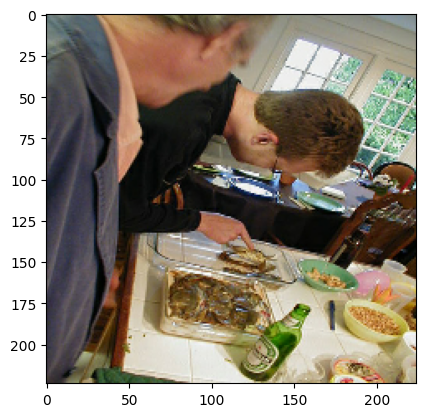

<start> Two men prepare dinner next to a bottle of beer . <end>


In [8]:
valid_images = list(valid_data.keys())
img_name = np.random.choice(valid_images)

# Read the image from the disk
sample_img = decode_and_resize(img_name)
img = sample_img.numpy().clip(0, 255).astype(np.uint8)
plt.imshow(img)
plt.show()
print(valid_data[img_name][0])


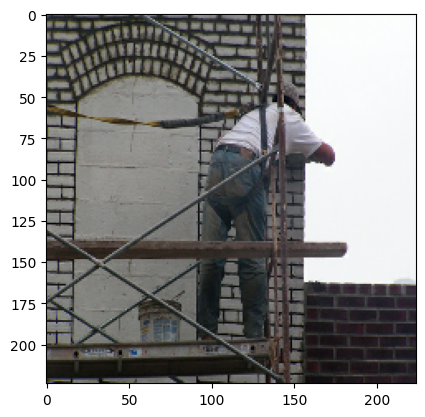

Actual Caption:  A man in a white t-shirt and jeans standing on a scaffold outside a building .
Predicted Caption:  a man is painting a wall
BLEU score 1.4637115948630222e-231


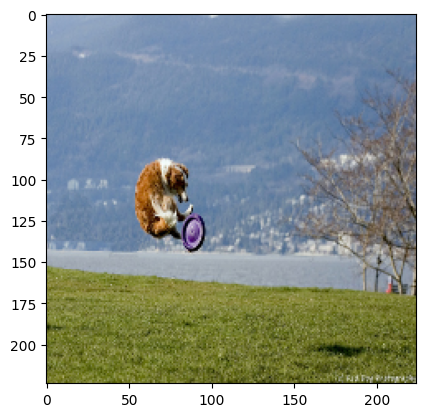

Actual Caption:  A brown dog is jumping in the air whilst trying to catch a purple Frisbee .
Predicted Caption:  a dog jumps in the air to catch a frisbee
BLEU score 1.4829635810350492e-231


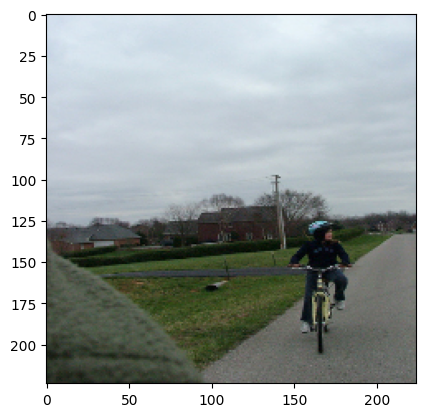

Actual Caption:  A kid wearing a helmet rides a yellow bike down the street on a cloudy day .
Predicted Caption:  a man riding a bike on a road
BLEU score 1.461181401143474e-231


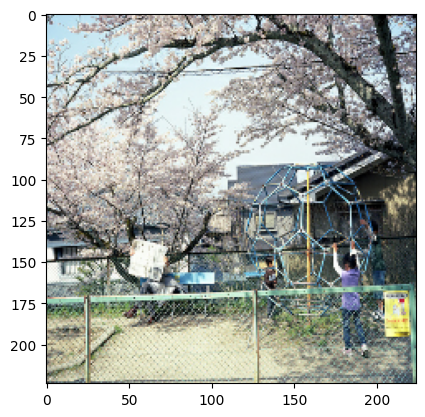

Actual Caption:  Three children play with a giant sphere on a playground while an adult sits on a bench reading the newspaper .
Predicted Caption:  a man in a green shirt is standing in front of a fence
BLEU score 1.2761323602556544e-231


In [107]:
from nltk.translate.bleu_score import sentence_bleu

vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(valid_data.keys())

def generate_caption():
    # Select a random image from the validation dataset
    
    img_name = np.random.choice(valid_images)

    # Read the image from the disk
    sample_img = decode_and_resize(img_name)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.show()
    actual_caption=(valid_data[img_name][0])

    # Pass the image to the CNN
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)

    # Pass the image features to the Transformer encoder
    encoded_img = caption_model.encoder(img, training=False)

    # Generate the caption using the Transformer decoder
    decoded_caption = "<start> "
    for i in range(max_decoded_sentence_length):
        tokenized_caption = vectorization([decoded_caption])[:, :-1]
        mask = tf.math.not_equal(tokenized_caption, 0)
        predictions = caption_model.decoder(
            tokenized_caption, encoded_img, training=False, mask=mask
        )
        sampled_token_index = np.argmax(predictions[0, i, :])
        sampled_token = index_lookup[sampled_token_index]
        if sampled_token == " <end>":
            break
        decoded_caption += " " + sampled_token

    decoded_caption = decoded_caption.replace("<start> ", "")
    decoded_caption = decoded_caption.replace(" <end>", "").strip()
    
    actual_caption = actual_caption.replace("<start> ", "")
    actual_caption = actual_caption.replace(" <end>", "").strip()
    print("Actual Caption: ", actual_caption)
    print("Predicted Caption: ", decoded_caption)
    
    sc=sentence_bleu(actual_caption, decoded_caption)
    print("BLEU score",sc)


# Check predictions for a few samples
generate_caption()
generate_caption()
generate_caption()
generate_caption()


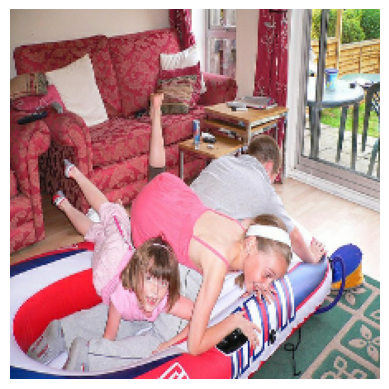

Actual Captions:
  a group of young children playing on a plastic boat inside a house
  A family jumps into a blow up raft in their living room .
  Children are playing in a raft inside of a house .
  Two parents and a young girl blow up a raft .
  Some kids are wrestling on an inflatable raft
Predicted Caption: a young girl in a pink shirt is laying on a couch
Image: 2601612082.jpg
BLEU score: 0.1239040201758117


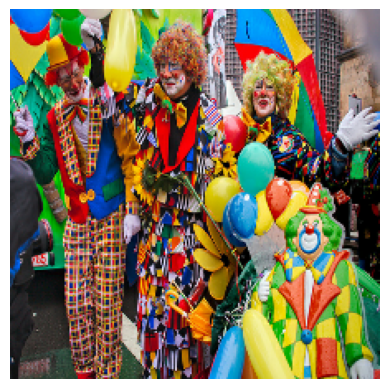

Actual Captions:
  Three colorful clowns with ballons posing next to another plastic clown .
  three people are dressed up as clowns in a city street .
  Three clowns in bright , multicolored costumes .
  The clowns are striking a pose for the camera .
  A troupe of flamboyant clowns .
Predicted Caption: a group of children are standing in a colorful parade
Image: 3300679815.jpg
BLEU score: 0.056122223243057295


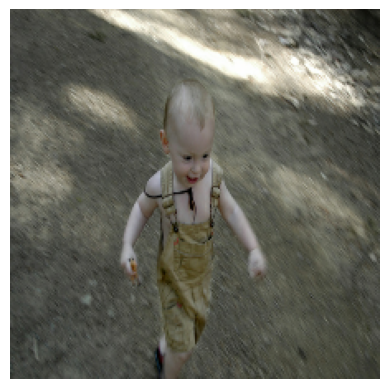

Actual Captions:
  A toddler is running down the path with an orange toy in his hand .
  A child in yellow overalls is walking over packed dirt .
  A little boy in overalls runs fast on a dirt trail .
  A child without a shirt running in the dirt .
  A small child in overalls running .
Predicted Caption: a little girl in a pink shirt is running on a dirt road
Image: 548751378.jpg
BLEU score: 0.10874855364455038


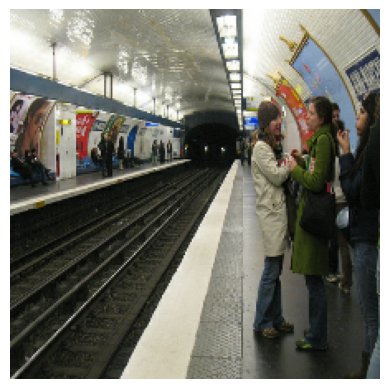

Actual Captions:
  A woman in a white coat speaks to a woman in a green coat while waiting for a train .
  A woman wearing a green coat , and a woman in a tan coat waiting for the subway .
  A group of woman discussing the artwork as they wait for the train .
  People stand on a subway platform waiting for their train .
  Two women are talking in a subway area .
Predicted Caption: a group of people are waiting for the train
Image: 2408570692.jpg
BLEU score: 0.21448629472025388


In [108]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import os

vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(valid_data.keys())

smooth_fn = SmoothingFunction().method1

def generate_caption():
    # Select a random image from the validation dataset
    img_name = np.random.choice(valid_images)

    # Read the image from the disk
    sample_img = decode_and_resize(img_name)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    
    actual_captions = valid_data[img_name]  # list of captions

    # Pass the image to the CNN
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)

    # Pass the image features to the Transformer encoder
    encoded_img = caption_model.encoder(img, training=False)

    # Generate the caption using the Transformer decoder
    decoded_caption = "<start> "
    for i in range(max_decoded_sentence_length):
        tokenized_caption = vectorization([decoded_caption])[:, :-1]
        mask = tf.math.not_equal(tokenized_caption, 0)
        predictions = caption_model.decoder(
            tokenized_caption, encoded_img, training=False, mask=mask
        )
        sampled_token_index = np.argmax(predictions[0, i, :])
        sampled_token = index_lookup[sampled_token_index]
        if sampled_token == "<end>":
            break
        decoded_caption += " " + sampled_token

    # Clean up captions
    decoded_caption = decoded_caption.replace("<start> ", "").replace(" <end>", "").strip()
    references_tokens = [cap.replace("<start> ", "").replace(" <end>", "").strip().split() for cap in actual_captions]

    print("Actual Captions:")
    for ref in references_tokens:
        print(" ", " ".join(ref))
    print("Predicted Caption:", decoded_caption)
    print("Image:", os.path.basename(img_name))

    hypothesis_tokens = decoded_caption.split()
    bleu_score = sentence_bleu(references_tokens, hypothesis_tokens, smoothing_function=smooth_fn)
    print("BLEU score:", bleu_score)

# Test on a few random samples
generate_caption()
generate_caption()
generate_caption()
generate_caption()


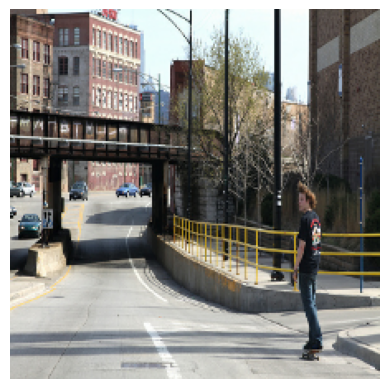

Actual Caption:  A man on a skateboard waits at the corner of a city street , with an overpass in the background .
Predicted Caption:  two people are walking down the street
Image: 4494095559.jpg
BLEU score: 0.005316168203911209


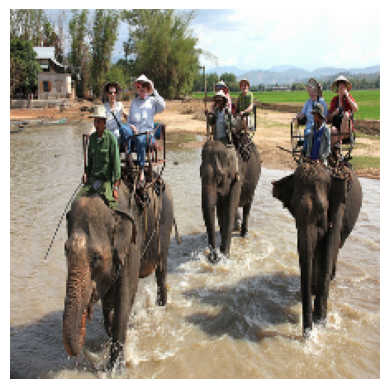

Actual Caption:  Three elephants , each carrying a group of people , walking through the water .
Predicted Caption:  four people are riding horses in a field
Image: 3552552910.jpg
BLEU score: 0.013769637489372186


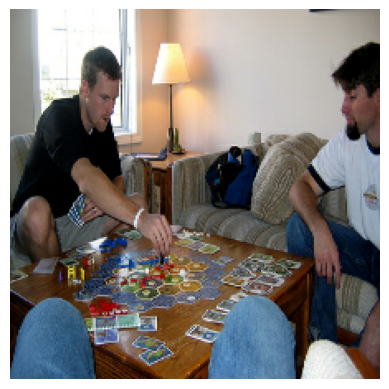

Actual Caption:  Two young men are playing a board game in the living room .
Predicted Caption:  a man and a woman are sitting at a table playing a board game
Image: 50831436.jpg
BLEU score: 0.18798317647335086


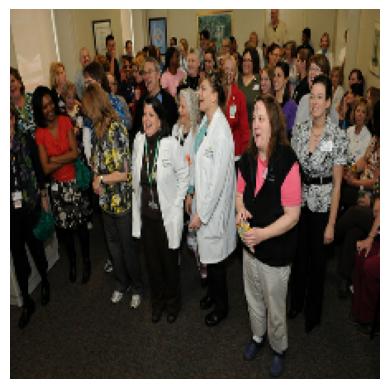

Actual Caption:  A group of people wearing name tags gather round in a conference room watching in front of them .
Predicted Caption:  a group of people are dancing in a room
Image: 4379561906.jpg
BLEU score: 0.05141895607836095


In [117]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(valid_data.keys())

smooth_fn = SmoothingFunction().method1

def generate_caption():
    # Select a random image from the validation dataset
    img_name = np.random.choice(valid_images)

    # Read the image from the disk
    sample_img = decode_and_resize(img_name)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)
    plt.imshow(img)
    plt.axis('off')
    plt.show()
    
    actual_caption = valid_data[img_name][0]

    # Pass the image to the CNN
    img = tf.expand_dims(sample_img, 0)
    img = caption_model.cnn_model(img)

    # Pass the image features to the Transformer encoder
    encoded_img = caption_model.encoder(img, training=False)

    # Generate the caption using the Transformer decoder
    decoded_caption = "<start> "
    for i in range(max_decoded_sentence_length):
        tokenized_caption = vectorization([decoded_caption])[:, :-1]
        mask = tf.math.not_equal(tokenized_caption, 0)
        predictions = caption_model.decoder(
            tokenized_caption, encoded_img, training=False, mask=mask
        )
        sampled_token_index = np.argmax(predictions[0, i, :])
        sampled_token = index_lookup[sampled_token_index]
        if sampled_token == "<end>":
            break
        decoded_caption += " " + sampled_token

    # Clean up captions
    decoded_caption = decoded_caption.replace("<start> ", "").replace(" <end>", "").strip()
    actual_caption = actual_caption.replace("<start> ", "").replace(" <end>", "").strip()

    print("Actual Caption: ", actual_caption)
    print("Predicted Caption: ", decoded_caption)
    print("Image:", os.path.basename(img_name))  # print filename like 123456.jpg

    # Calculate BLEU score properly with tokenization and smoothing
    reference_tokens = [actual_caption.split()]
    hypothesis_tokens = decoded_caption.split()
    bleu_score = sentence_bleu(reference_tokens, hypothesis_tokens, smoothing_function=smooth_fn)
    print("BLEU score:", bleu_score)

# Test on a few random samples
generate_caption()
generate_caption()
generate_caption()
generate_caption()


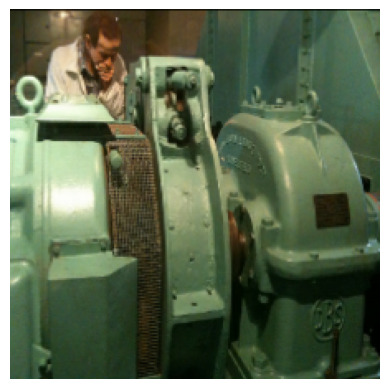

Predicted Caption: a man is working on a machine


In [10]:
vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))
max_decoded_sentence_length = SEQ_LENGTH - 1
valid_images = list(valid_data.keys())

def generate_caption_for_image(image_path):
    # Load and preprocess the image
    sample_img = decode_and_resize(image_path)
    img = sample_img.numpy().clip(0, 255).astype(np.uint8)

    # Display the image
    plt.imshow(img)
    plt.axis('off')
    plt.show()

    # Expand dimensions to simulate batch
    img = tf.expand_dims(sample_img, 0)

    # Extract features using CNN
    img_features = caption_model.cnn_model(img)

    # Encode features using Transformer encoder
    encoded_img = caption_model.encoder(img_features, training=False)

    # Start caption generation with <start> token
    decoded_caption = "<start> "
    for i in range(max_decoded_sentence_length):
        tokenized_caption = vectorization([decoded_caption])[:, :-1]
        mask = tf.math.not_equal(tokenized_caption, 0)
        predictions = caption_model.decoder(
            tokenized_caption, encoded_img, training=False, mask=mask
        )
        sampled_token_index = np.argmax(predictions[0, i, :])
        sampled_token = index_lookup[sampled_token_index]
        if sampled_token == "<end>":
            break
        decoded_caption += " " + sampled_token

    # Clean up the final caption
    decoded_caption = decoded_caption.replace("<start> ", "").replace(" <end>", "").strip()
    print("Predicted Caption:", decoded_caption)

generate_caption_for_image(".../Desktop/doc.png")


In [116]:
import heapq

vocab = vectorization.get_vocabulary()
index_lookup = dict(zip(range(len(vocab)), vocab))

def beam_search_caption(image_path, beam_width=3, alpha=0.7, max_length=25):
    # Preprocess image and extract encoded features
    sample_img = decode_and_resize(image_path)
    img = tf.expand_dims(sample_img, 0)
    img_features = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img_features, training=False)

    # Initialize beam as list of tuples: (score, caption_tokens)
    # Start with "<start>" token index
    start_token = vectorization('<start>').numpy()[0]
    end_token = vectorization('<end>').numpy()[0]

    beam = [(0.0, [start_token])]  # log prob 0, sequence starting with start token

    for _ in range(max_length):
        candidates = []
        for score, seq in beam:
            if seq[-1] == end_token:
                # Already ended, keep it
                candidates.append((score, seq))
                continue

            # Prepare input tokens and mask
            seq_input = tf.expand_dims(seq, 0)  # batch size 1
            mask = tf.math.not_equal(seq_input, 0)

            # Predict next token probabilities
            preds = caption_model.decoder(seq_input, encoded_img, training=False, mask=mask)
            preds = preds[0, -1, :].numpy()  # probabilities of next token

            # Get top beam_width predictions
            top_indices = np.argsort(preds)[-beam_width:]
            for idx in top_indices:
                prob = preds[idx]
                if prob == 0:
                    continue
                new_seq = seq + [idx]
                # Calculate log probability and apply length penalty alpha
                length_penalty = ((5 + len(new_seq)) / 6) ** alpha
                new_score = score + np.log(prob) / length_penalty
                candidates.append((new_score, new_seq))

        # Select beam_width best candidates
        beam = heapq.nlargest(beam_width, candidates, key=lambda x: x[0])

        # If all sequences ended with <end>, stop early
        if all(seq[-1] == end_token for _, seq in beam):
            break

    # Choose best sequence from beam
    best_score, best_seq = max(beam, key=lambda x: x[0])

    # Convert token ids back to words
    tokens = [index_lookup.get(idx, '') for idx in best_seq]

    # Remove <start> and <end> tokens from caption
    caption_tokens = [t for t in tokens if t not in ['<start>', '<end>', '']]
    caption = ' '.join(caption_tokens).strip()

    print(f"Beam Search Caption (beam_width={beam_width}, alpha={alpha}):")
    return caption

beam_search_caption(".../Desktop/zz.jpg", beam_width=5, alpha=5, max_length=25)


Beam Search Caption (beam_width=5, alpha=5):


'a man in a red shirt and jeans is sitting on a wooden bench'

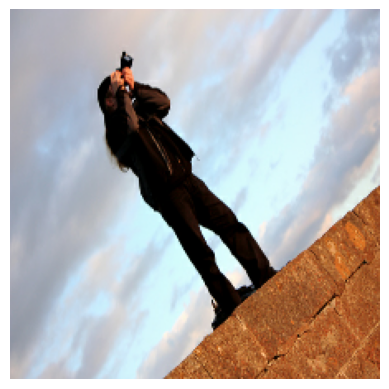

Image: 3445428367.jpg
Actual Captions:
  A person is standing on a brick ledge taking a picture of something in the distance .
  A woman with long hair pointing her camera skyward as she stands on a brick wall .
  The woman is holding a camera and standing on a brick wall .
  Woman standing on a brick wall and taking a picture
  A woman takes a photograph .
Predicted Caption: a man is standing on a wooden platform
BLEU-1: 0.625000 | BLEU-2: 0.517549 | BLEU-3: 0.450566 | BLEU-4: 0.365555
--------------------------------------------------


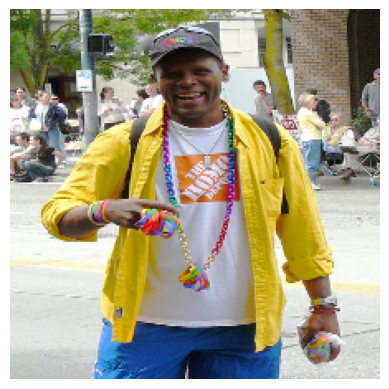

Image: 1528205014.jpg
Actual Captions:
  The man wearing a colorful outfit is holding something in both hands and smiling for the camera .
  A man in a yellow jacket with many colorful wristbands is smiling .
  A man in a yellow shirt wearing multicolored plastic jewelry .
  A man is wearing a rainbow colored necklace and smiling .
  Black man poses for photo .
Predicted Caption: a man in a yellow shirt and blue jeans is walking down the street
BLEU-1: 0.571429 | BLEU-2: 0.419314 | BLEU-3: 0.356612 | BLEU-4: 0.298995
--------------------------------------------------


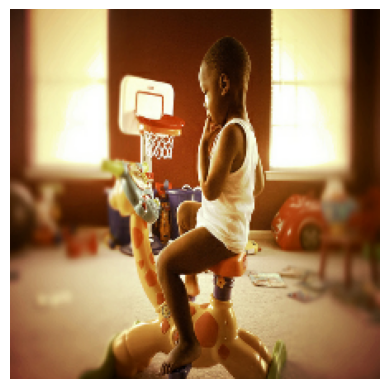

Image: 4922045286.jpg
Actual Captions:
  A little boy is sitting on a toy giraffe with his finger in his mouth .
  A little boy is sitting on a giraffe bouncy while learning .
  A black child sitting on a toy giraffe biting his fingers .
  A small boy is riding a giraffe shaped bike .
  A child sitting on a toy thinking .
Predicted Caption: a young man in a white shirt is sitting on the floor
BLEU-1: 0.416667 | BLEU-2: 0.275241 | BLEU-3: 0.199623 | BLEU-4: 0.095785
--------------------------------------------------


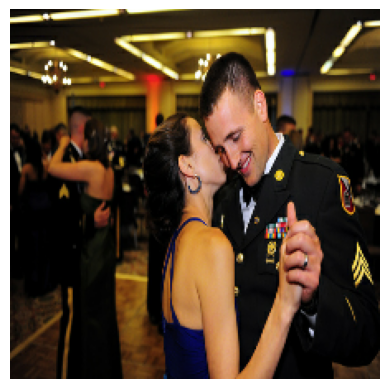

Image: 7178610575.jpg
Actual Captions:
  A man dressed in a military uniform gets a kiss on the cheek from a woman in a blue dress .
  Closeup shot of a military man and woman in a blue dress dancing at a military ball .
  A officer in the military dancing with a young woman in a blue dress .
  A ladies whisper has brought a smile to a GI 's face .
  Military couple enjoying dance at officers function .
Predicted Caption: a man in a black shirt holding a microphone
BLEU-1: 0.555556 | BLEU-2: 0.263523 | BLEU-3: 0.102061 | BLEU-4: 0.063767
--------------------------------------------------


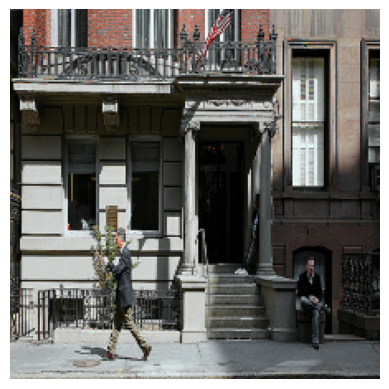

Image: 4711632344.jpg
Actual Captions:
  a man wearing a suit jacket is reading paper and walking while another man is sitting on stoop .
  A man in business suit is walking by an apartment building where two other men are hanging out .
  One man walks past a building , while another sits in front of the building on a stoop .
  A man in a suit is reading the paper while he walks down the street .
  A man is walking past a building where another man is sitting .
Predicted Caption: two people are walking on the street
BLEU-1: 0.363748 | BLEU-2: 0.160398 | BLEU-3: 0.061405 | BLEU-4: 0.039014
--------------------------------------------------


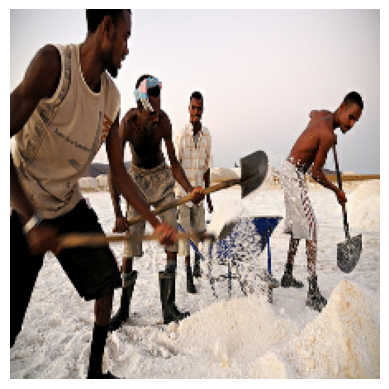

Image: 3632258003.jpg
Actual Captions:
  These four men , two shirtless , are shoveling sand .
  A group of men with shovels are digging in salt .
  Men with shovels shoveling white sand .
  Men shovel snow while wearing shorts .
  Four men shovel what looks like sand .
Predicted Caption: a group of people are standing in the snow
BLEU-1: 0.555556 | BLEU-2: 0.263523 | BLEU-3: 0.102061 | BLEU-4: 0.063767
--------------------------------------------------


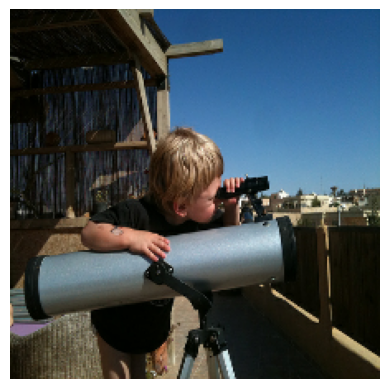

Image: 5669914204.jpg
Actual Captions:
  A small boy on a patio leans into a large portable telescope , looking into the eyepiece .
  A young boy is looking out over the city through a telescope .
  A caucasian boy with blond-hair is looking into a telescope .
  A little boy looking at his telescope in daytime .
  Young boy looking through a telescope at midday .
Predicted Caption: a little boy in a blue shirt is holding a camera
BLEU-1: 0.545455 | BLEU-2: 0.233550 | BLEU-3: 0.086742 | BLEU-4: 0.052463
--------------------------------------------------


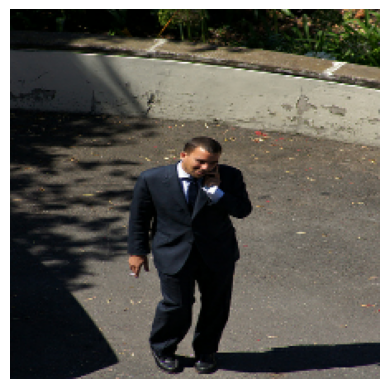

Image: 4826619341.jpg
Actual Captions:
  Guy in a dark suit , with a cigarette in his right hand while talking on the phone .
  A man in black suit and pant talks in phone with a cigarette at his hand .
  A man in a suit is smoking a cigarette and talking on his cellphone .
  A man smoking a cigarette standing in an empty pool .
  A man in a suit is smoking and talking on the phone .
Predicted Caption: a man in a suit walks down the street
BLEU-1: 0.533825 | BLEU-2: 0.400369 | BLEU-3: 0.335172 | BLEU-4: 0.264497
--------------------------------------------------


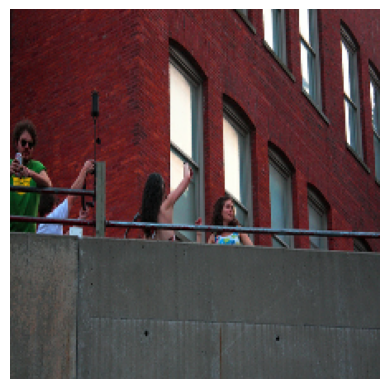

Image: 2668574576.jpg
Actual Captions:
  Four people are standing above the photo line in front of a red brick building taking photographs .
  Four people are standing behind a balcony in front of a brick building .
  People sitting on a balcony enjoying some relaxing time .
  A red brick building with a man and two women near it .
  4 people are standing in front of a red brick building
Predicted Caption: a construction worker is painting a wall
BLEU-1: 0.186125 | BLEU-2: 0.044954 | BLEU-3: 0.030682 | BLEU-4: 0.025589
--------------------------------------------------


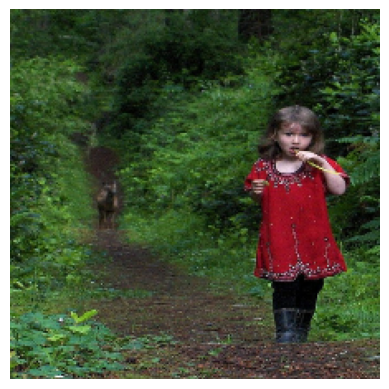

Image: 161240978.jpg
Actual Captions:
  A little girl in a red dress is standing on a trail in the forest with a horse in the background .
  A young child in a red shirt is chewing a stem of grass and there is a horse in the background .
  A young girl in a red dress walking down a forest path with a deer trailing behind her .
  A young girl in a red dress is walking on a trail in the woods with a deer behind her .
  A young girl in a red dress walking down a dirt path in a grassy green forest .
Predicted Caption: a little girl in a red shirt is standing in the woods
BLEU-1: 0.606531 | BLEU-2: 0.548628 | BLEU-3: 0.479604 | BLEU-4: 0.414531
--------------------------------------------------
Average BLEU-1 score over 100 samples: 0.5471
Average BLEU-2 score over 100 samples: 0.3606
Average BLEU-3 score over 100 samples: 0.2378
Average BLEU-4 score over 100 samples: 0.1607


In [95]:
import os
import heapq
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

smooth_fn = SmoothingFunction().method1

# Beam search caption generation function
def beam_search_caption(image_path, beam_width=3, alpha=0.7, max_length=25):
    sample_img = decode_and_resize(image_path)
    img = tf.expand_dims(sample_img, 0)
    img_features = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img_features, training=False)

    start_token = vectorization('<start>').numpy()[0]
    end_token = vectorization('<end>').numpy()[0]

    beam = [(0.0, [start_token])]  # (score, token_seq)

    for _ in range(max_length):
        candidates = []
        for score, seq in beam:
            if seq[-1] == end_token:
                candidates.append((score, seq))
                continue

            seq_input = tf.expand_dims(seq, 0)
            mask = tf.math.not_equal(seq_input, 0)

            preds = caption_model.decoder(seq_input, encoded_img, training=False, mask=mask)
            preds = preds[0, -1, :].numpy()

            top_indices = np.argsort(preds)[-beam_width:]
            for idx in top_indices:
                prob = preds[idx]
                if prob == 0:
                    continue
                new_seq = seq + [idx]
                length_penalty = ((5 + len(new_seq)) / 6) ** alpha
                new_score = score + np.log(prob) / length_penalty
                candidates.append((new_score, new_seq))

        beam = heapq.nlargest(beam_width, candidates, key=lambda x: x[0])

        if all(seq[-1] == end_token for _, seq in beam):
            break

    best_score, best_seq = max(beam, key=lambda x: x[0])
    tokens = [index_lookup.get(idx, '') for idx in best_seq]
    caption_tokens = [t for t in tokens if t not in ['<start>', '<end>', '']]
    caption = ' '.join(caption_tokens).strip()
    return caption

# BLEU evaluation function using beam search captions
def evaluate_bleu_on_val_with_beam(num_samples=100, beam_width=3, alpha=0.7):
    bleu1_scores = []
    bleu2_scores = []
    bleu3_scores = []
    bleu4_scores = []
    sample_images = valid_images[:num_samples]

    for i, img_path in enumerate(sample_images, 1):
        actual_captions = valid_data[img_path]
        references_tokens = [
            cap.replace("<start> ", "").replace(" <end>", "").strip().split()
            for cap in actual_captions
        ]

        predicted_caption = beam_search_caption(img_path, beam_width=beam_width, alpha=alpha)
        hypothesis_tokens = predicted_caption.split()

        bleu1 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(1, 0, 0, 0),
            smoothing_function=smooth_fn,
        )
        bleu2 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(0.5, 0.5, 0, 0),
            smoothing_function=smooth_fn,
        )
        bleu3 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(0.33, 0.33, 0.33, 0),
            smoothing_function=smooth_fn,
        )
        bleu4 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(0.25, 0.25, 0.25, 0.25),
            smoothing_function=smooth_fn,
        )

        bleu1_scores.append(bleu1)
        bleu2_scores.append(bleu2)
        bleu3_scores.append(bleu3)
        bleu4_scores.append(bleu4)

        if i % 10 == 0:
            # Show image
            sample_img = decode_and_resize(img_path)
            img_np = sample_img.numpy().clip(0, 255).astype(np.uint8)
            plt.imshow(img_np)
            plt.axis('off')
            plt.show()

            print(f"Image: {os.path.basename(img_path)}")
            print("Actual Captions:")
            for ref in references_tokens:
                print(" ", " ".join(ref))
            print("Predicted Caption:", predicted_caption)
            print(f"BLEU-1: {bleu1:.6f} | BLEU-2: {bleu2:.6f} | BLEU-3: {bleu3:.6f} | BLEU-4: {bleu4:.6f}")
            print("-" * 50)

    print(f"Average BLEU-1 score over {num_samples} samples: {np.mean(bleu1_scores):.4f}")
    print(f"Average BLEU-2 score over {num_samples} samples: {np.mean(bleu2_scores):.4f}")
    print(f"Average BLEU-3 score over {num_samples} samples: {np.mean(bleu3_scores):.4f}")
    print(f"Average BLEU-4 score over {num_samples} samples: {np.mean(bleu4_scores):.4f}")

# Run the evaluation with desired beam width and alpha
evaluate_bleu_on_val_with_beam(num_samples=100, beam_width=5, alpha=0.8)


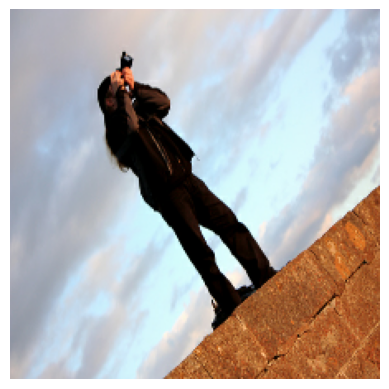

Image: 3445428367.jpg
Actual Captions:
  A person is standing on a brick ledge taking a picture of something in the distance .
  A woman with long hair pointing her camera skyward as she stands on a brick wall .
  The woman is holding a camera and standing on a brick wall .
  Woman standing on a brick wall and taking a picture
  A woman takes a photograph .
Predicted Caption: a man is standing on a wooden platform
BLEU-1: 0.625000 | BLEU-2: 0.517549 | BLEU-3: 0.450566 | BLEU-4: 0.365555
--------------------------------------------------


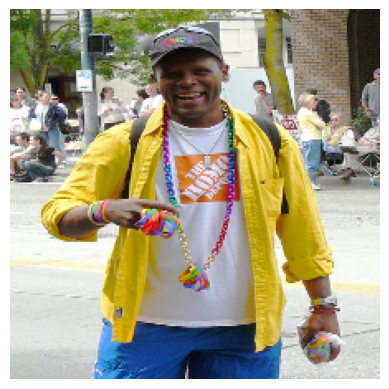

Image: 1528205014.jpg
Actual Captions:
  The man wearing a colorful outfit is holding something in both hands and smiling for the camera .
  A man in a yellow jacket with many colorful wristbands is smiling .
  A man in a yellow shirt wearing multicolored plastic jewelry .
  A man is wearing a rainbow colored necklace and smiling .
  Black man poses for photo .
Predicted Caption: a man in a yellow shirt and blue jeans is walking down the street
BLEU-1: 0.571429 | BLEU-2: 0.419314 | BLEU-3: 0.356612 | BLEU-4: 0.298995
--------------------------------------------------


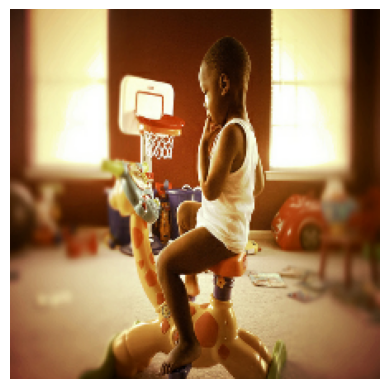

Image: 4922045286.jpg
Actual Captions:
  A little boy is sitting on a toy giraffe with his finger in his mouth .
  A little boy is sitting on a giraffe bouncy while learning .
  A black child sitting on a toy giraffe biting his fingers .
  A small boy is riding a giraffe shaped bike .
  A child sitting on a toy thinking .
Predicted Caption: a young man in a white shirt is sitting on the floor
BLEU-1: 0.416667 | BLEU-2: 0.275241 | BLEU-3: 0.199623 | BLEU-4: 0.095785
--------------------------------------------------


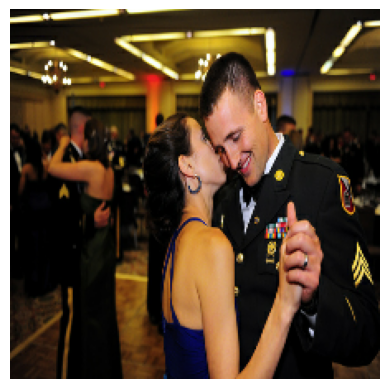

Image: 7178610575.jpg
Actual Captions:
  A man dressed in a military uniform gets a kiss on the cheek from a woman in a blue dress .
  Closeup shot of a military man and woman in a blue dress dancing at a military ball .
  A officer in the military dancing with a young woman in a blue dress .
  A ladies whisper has brought a smile to a GI 's face .
  Military couple enjoying dance at officers function .
Predicted Caption: a man in a black shirt is holding a microphone
BLEU-1: 0.500000 | BLEU-2: 0.235702 | BLEU-3: 0.090728 | BLEU-4: 0.056122
--------------------------------------------------


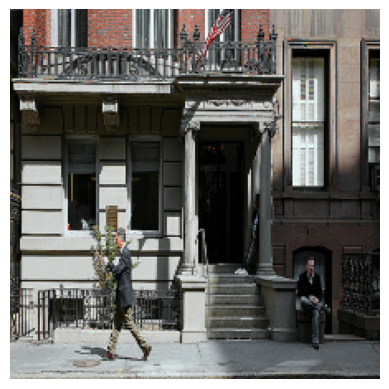

Image: 4711632344.jpg
Actual Captions:
  a man wearing a suit jacket is reading paper and walking while another man is sitting on stoop .
  A man in business suit is walking by an apartment building where two other men are hanging out .
  One man walks past a building , while another sits in front of the building on a stoop .
  A man in a suit is reading the paper while he walks down the street .
  A man is walking past a building where another man is sitting .
Predicted Caption: two people are walking on the sidewalk
BLEU-1: 0.303123 | BLEU-2: 0.046303 | BLEU-3: 0.027044 | BLEU-4: 0.020961
--------------------------------------------------


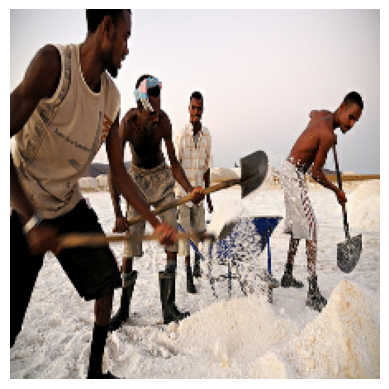

Image: 3632258003.jpg
Actual Captions:
  These four men , two shirtless , are shoveling sand .
  A group of men with shovels are digging in salt .
  Men with shovels shoveling white sand .
  Men shovel snow while wearing shorts .
  Four men shovel what looks like sand .
Predicted Caption: a group of people are standing in the snow
BLEU-1: 0.555556 | BLEU-2: 0.263523 | BLEU-3: 0.102061 | BLEU-4: 0.063767
--------------------------------------------------


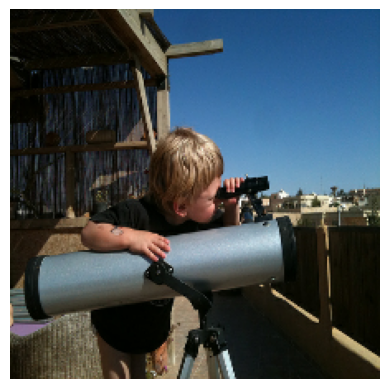

Image: 5669914204.jpg
Actual Captions:
  A small boy on a patio leans into a large portable telescope , looking into the eyepiece .
  A young boy is looking out over the city through a telescope .
  A caucasian boy with blond-hair is looking into a telescope .
  A little boy looking at his telescope in daytime .
  Young boy looking through a telescope at midday .
Predicted Caption: a boy in a blue shirt is looking at the sky
BLEU-1: 0.727273 | BLEU-2: 0.381385 | BLEU-3: 0.119895 | BLEU-4: 0.067042
--------------------------------------------------


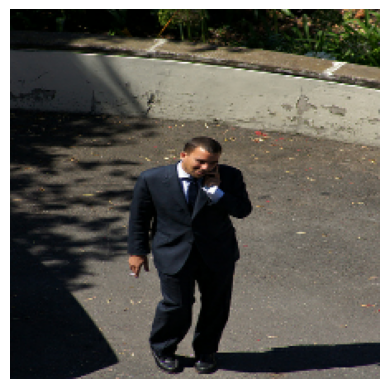

Image: 4826619341.jpg
Actual Captions:
  Guy in a dark suit , with a cigarette in his right hand while talking on the phone .
  A man in black suit and pant talks in phone with a cigarette at his hand .
  A man in a suit is smoking a cigarette and talking on his cellphone .
  A man smoking a cigarette standing in an empty pool .
  A man in a suit is smoking and talking on the phone .
Predicted Caption: a man in a suit is standing on a street
BLEU-1: 0.723870 | BLEU-2: 0.539541 | BLEU-3: 0.465372 | BLEU-4: 0.399750
--------------------------------------------------


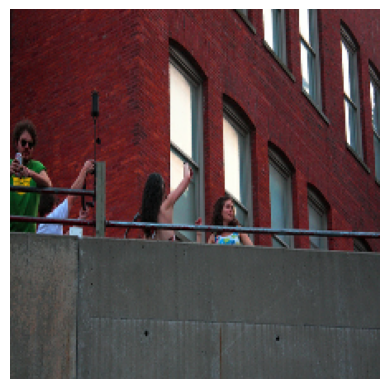

Image: 2668574576.jpg
Actual Captions:
  Four people are standing above the photo line in front of a red brick building taking photographs .
  Four people are standing behind a balcony in front of a brick building .
  People sitting on a balcony enjoying some relaxing time .
  A red brick building with a man and two women near it .
  4 people are standing in front of a red brick building
Predicted Caption: a construction worker is working on a wall
BLEU-1: 0.292050 | BLEU-2: 0.180257 | BLEU-3: 0.076769 | BLEU-4: 0.050627
--------------------------------------------------


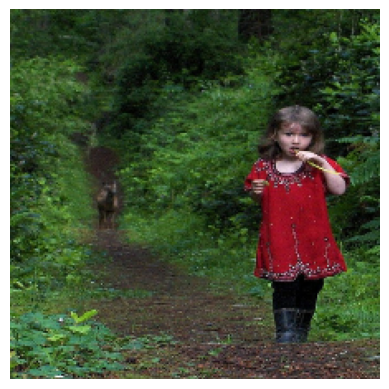

Image: 161240978.jpg
Actual Captions:
  A little girl in a red dress is standing on a trail in the forest with a horse in the background .
  A young child in a red shirt is chewing a stem of grass and there is a horse in the background .
  A young girl in a red dress walking down a forest path with a deer trailing behind her .
  A young girl in a red dress is walking on a trail in the woods with a deer behind her .
  A young girl in a red dress walking down a dirt path in a grassy green forest .
Predicted Caption: a little girl in red shirt is holding a pink flowers
BLEU-1: 0.384882 | BLEU-2: 0.285436 | BLEU-3: 0.214344 | BLEU-4: 0.089227
--------------------------------------------------
Average BLEU-1 score over 100 samples: 0.5505
Average BLEU-2 score over 100 samples: 0.3736
Average BLEU-3 score over 100 samples: 0.2417
Average BLEU-4 score over 100 samples: 0.1563


In [12]:
import os
import heapq
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

smooth_fn = SmoothingFunction().method1

# Beam search caption generation function
def beam_search_caption(image_path, beam_width=5, alpha=10, max_length=25):
    sample_img = decode_and_resize(image_path)
    img = tf.expand_dims(sample_img, 0)
    img_features = caption_model.cnn_model(img)
    encoded_img = caption_model.encoder(img_features, training=False)

    start_token = vectorization('<start>').numpy()[0]
    end_token = vectorization('<end>').numpy()[0]

    beam = [(0.0, [start_token])]  # (score, token_seq)

    for _ in range(max_length):
        candidates = []
        for score, seq in beam:
            if seq[-1] == end_token:
                candidates.append((score, seq))
                continue

            seq_input = tf.expand_dims(seq, 0)
            mask = tf.math.not_equal(seq_input, 0)

            preds = caption_model.decoder(seq_input, encoded_img, training=False, mask=mask)
            preds = preds[0, -1, :].numpy()

            top_indices = np.argsort(preds)[-beam_width:]
            for idx in top_indices:
                prob = preds[idx]
                if prob == 0:
                    continue
                new_seq = seq + [idx]
                length_penalty = ((5 + len(new_seq)) / 6) ** alpha
                new_score = score + np.log(prob) / length_penalty
                candidates.append((new_score, new_seq))

        beam = heapq.nlargest(beam_width, candidates, key=lambda x: x[0])

        if all(seq[-1] == end_token for _, seq in beam):
            break

    best_score, best_seq = max(beam, key=lambda x: x[0])
    tokens = [index_lookup.get(idx, '') for idx in best_seq]
    caption_tokens = [t for t in tokens if t not in ['<start>', '<end>', '']]
    caption = ' '.join(caption_tokens).strip()
    return caption

# BLEU evaluation function using beam search captions
def evaluate_bleu_on_val_with_beam(num_samples=100, beam_width=3, alpha=0.7):
    bleu1_scores = []
    bleu2_scores = []
    bleu3_scores = []
    bleu4_scores = []
    sample_images = valid_images[:num_samples]

    for i, img_path in enumerate(sample_images, 1):
        actual_captions = valid_data[img_path]
        references_tokens = [
            cap.replace("<start> ", "").replace(" <end>", "").strip().split()
            for cap in actual_captions
        ]

        predicted_caption = beam_search_caption(img_path, beam_width=beam_width, alpha=alpha)
        hypothesis_tokens = predicted_caption.split()

        bleu1 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(1, 0, 0, 0),
            smoothing_function=smooth_fn,
        )
        bleu2 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(0.5, 0.5, 0, 0),
            smoothing_function=smooth_fn,
        )
        bleu3 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(0.33, 0.33, 0.33, 0),
            smoothing_function=smooth_fn,
        )
        bleu4 = sentence_bleu(
            references_tokens,
            hypothesis_tokens,
            weights=(0.25, 0.25, 0.25, 0.25),
            smoothing_function=smooth_fn,
        )

        bleu1_scores.append(bleu1)
        bleu2_scores.append(bleu2)
        bleu3_scores.append(bleu3)
        bleu4_scores.append(bleu4)

        if i % 10 == 0:
            # Show image
            sample_img = decode_and_resize(img_path)
            img_np = sample_img.numpy().clip(0, 255).astype(np.uint8)
            plt.imshow(img_np)
            plt.axis('off')
            plt.show()

            print(f"Image: {os.path.basename(img_path)}")
            print("Actual Captions:")
            for ref in references_tokens:
                print(" ", " ".join(ref))
            print("Predicted Caption:", predicted_caption)
            print(f"BLEU-1: {bleu1:.6f} | BLEU-2: {bleu2:.6f} | BLEU-3: {bleu3:.6f} | BLEU-4: {bleu4:.6f}")
            print("-" * 50)

    print(f"Average BLEU-1 score over {num_samples} samples: {np.mean(bleu1_scores):.4f}")
    print(f"Average BLEU-2 score over {num_samples} samples: {np.mean(bleu2_scores):.4f}")
    print(f"Average BLEU-3 score over {num_samples} samples: {np.mean(bleu3_scores):.4f}")
    print(f"Average BLEU-4 score over {num_samples} samples: {np.mean(bleu4_scores):.4f}")

# Run the evaluation with desired beam width and alpha
evaluate_bleu_on_val_with_beam(num_samples=100, beam_width=10, alpha=20)
